<a href="https://colab.research.google.com/github/MayANK1998/smart_camera/blob/master/fireIntensityDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd 
from keras.preprocessing.image import ImageDataGenerator, load_img
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random
import os


Using TensorFlow backend.


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
FAST_RUN = False
IMAGE_WIDTH=500
IMAGE_HEIGHT=500
IMAGE_SIZE=(IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_CHANNELS=3

In [0]:
fireData = os.listdir("../content/drive/My Drive/FYP/fire")
candleFireData = os.listdir("../content/drive/My Drive/FYP/candle flame")

In [0]:

filenames = []
categories = []
train = []
SPECIES = ['harm','non_harm']
for filename in fireData:
  filenames.append(filename)
  a = filename.split('.')
  if(a[0]=='harm'):
    categories.append(1)
  else:
    categories.append(0)

df = pd.DataFrame({
    'filename' : filenames,
    'category' : categories
    })

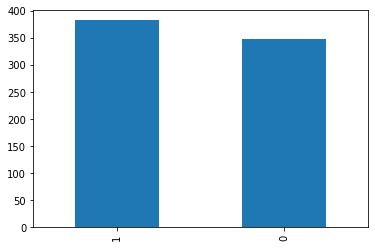

In [6]:
df['category'].value_counts().plot.bar()

In [7]:
df.head()

,filename,category
0,harm.1.Large_bonfire.jpg,1
1,harm.100.Fire.jpg,1
2,harm.103.fire-29.jpg,1
3,harm.104.ca_1004NID_Indonesia_Fire_online.jpg,1
4,harm.106.Fire.jpg,1


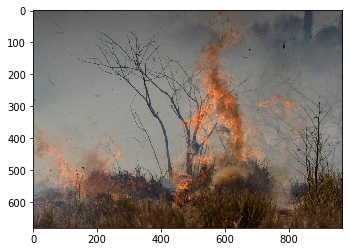

In [8]:
sample = random.choice(fireData)
image = load_img("../content/drive/My Drive/FYP/fire/"+sample)
plt.imshow(image)

In [9]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization

model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax')) 

model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

model.summary()













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 498, 498, 32)      896       
_________________________________________________________________
batch_normalization_1 (Batch (None, 498, 498, 32)      128       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 249, 249, 32)      0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 249, 249, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 247, 247, 64)      18496     
_________________________________________________________________
batch_normalization_2 (Batch (None, 247, 247, 64)      25

In [0]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
earlystop = EarlyStopping(patience=10)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)
callbacks = [earlystop, learning_rate_reduction]

In [0]:
df["category"] = df["category"].replace({0: 'non-harm', 1: 'harm'}) 
train_df, validate_df = train_test_split(df, test_size=0.20, random_state=42)
train_df = train_df.reset_index(drop=True)
validate_df = validate_df.reset_index(drop=True)

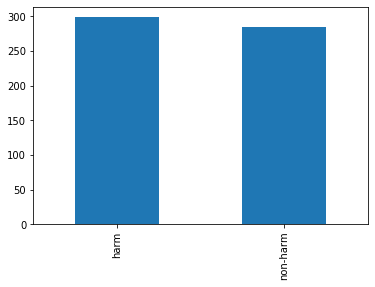

In [12]:
train_df['category'].value_counts().plot.bar()

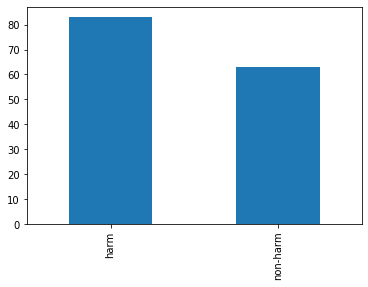

In [13]:
validate_df['category'].value_counts().plot.bar()

In [0]:
total_train = train_df.shape[0]
total_validate = validate_df.shape[0]
batch_size=15


In [15]:
train_datagen = ImageDataGenerator(
    rotation_range=15,
    rescale=1./255,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    width_shift_range=0.1,
    height_shift_range=0.1
)

train_generator = train_datagen.flow_from_dataframe(
    train_df, 
    "../content/drive/My Drive/FYP/fire", 
    x_col='filename',
    y_col='category',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=batch_size
)

Found 580 validated image filenames belonging to 2 classes.


/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/dataframe_iterator.py:273: UserWarning: Found 3 invalid image filename(s) in x_col="filename". These filename(s) will be ignored.
  .format(n_invalid, x_col)


In [16]:
validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
    validate_df, 
    "../content/drive/My Drive/FYP/fire", 
    x_col='filename',
    y_col='category',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=batch_size
)

Found 146 validated image filenames belonging to 2 classes.


Found 1 validated image filenames belonging to 1 classes.


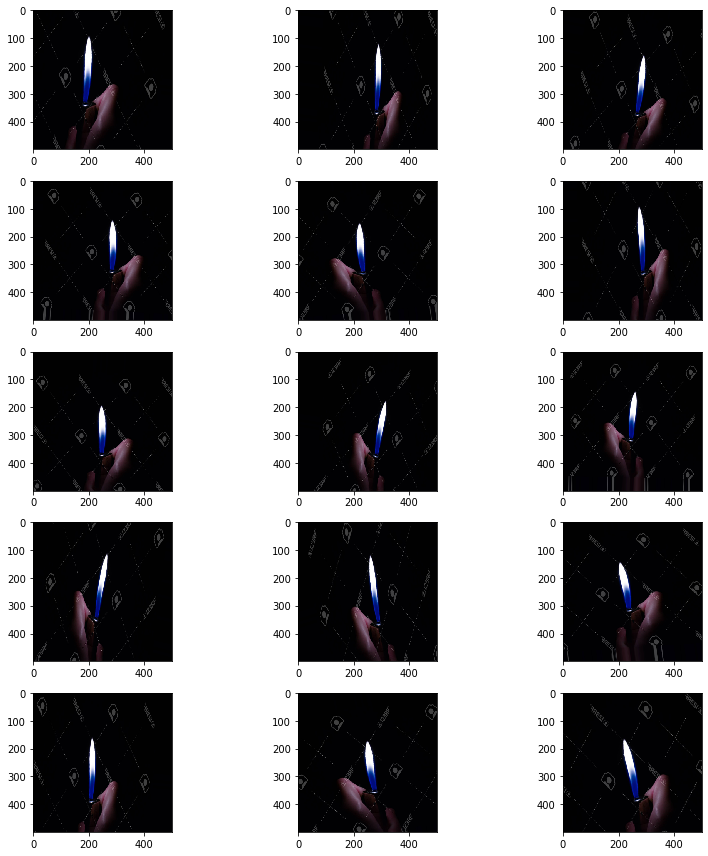

In [17]:
example_df = train_df.sample(n=1).reset_index(drop=True)
example_generator = train_datagen.flow_from_dataframe(
    example_df, 
    "../content/drive/My Drive/FYP/fire", 
    x_col='filename',
    y_col='category',
    target_size=IMAGE_SIZE,
    class_mode='categorical'
)
plt.figure(figsize=(12, 12))
for i in range(0, 15):
    plt.subplot(5, 3, i+1)
    for X_batch, Y_batch in example_generator:
        image = X_batch[0]
        plt.imshow(image)
        break
plt.tight_layout()
plt.show()

In [40]:
epochs=3 if FAST_RUN else 50
history = model.fit_generator(
    train_generator, 
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=total_validate//batch_size,
    steps_per_epoch=total_train//batch_size,
    callbacks=callbacks
)

Epoch 1/50
24/38 [=================>............] - ETA: 1:24 - loss: 1.3981 - acc: 0.7069

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:802: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


38/38 [==============================] - 233s 6s/step - loss: 1.1118 - acc: 0.7272 - val_loss: 0.7245 - val_acc: 0.7407
Epoch 2/50
38/38 [==============================] - 47s 1s/step - loss: 0.6728 - acc: 0.7991 - val_loss: 0.5369 - val_acc: 0.8855
Epoch 3/50
38/38 [==============================] - 43s 1s/step - loss: 0.7827 - acc: 0.7439 - val_loss: 0.2637 - val_acc: 0.8855
Epoch 4/50
38/38 [==============================] - 40s 1s/step - loss: 0.5089 - acc: 0.8368 - val_loss: 2.1916 - val_acc: 0.7328

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
Epoch 5/50
38/38 [==============================] - 44s 1s/step - loss: 0.4748 - acc: 0.8342 - val_loss: 0.2686 - val_acc: 0.9008
Epoch 6/50
38/38 [==============================] - 40s 1s/step - loss: 0.3868 - acc: 0.8614 - val_loss: 0.2549 - val_acc: 0.9313
Epoch 7/50
38/38 [==============================] - 38s 996ms/step - loss: 0.3158 - acc: 0.8886 - val_loss: 0.2157 - val_acc: 0.9008
Epoch 8/50
38/38

In [41]:
from google.colab import files

model.save_weights("fireIntensityDetectionModel500.h5")
model_file = files.download('fireIntensityDetectionModel500.h5')


----------------------------------------
Exception happened during processing of request from ('::ffff:127.0.0.1', 48396, 0, 0)
Traceback (most recent call last):
  File "/usr/lib/python3.6/socketserver.py", line 320, in _handle_request_noblock
    self.process_request(request, client_address)
  File "/usr/lib/python3.6/socketserver.py", line 351, in process_request
    self.finish_request(request, client_address)
  File "/usr/lib/python3.6/socketserver.py", line 364, in finish_request
    self.RequestHandlerClass(request, client_address, self)
  File "/usr/lib/python3.6/socketserver.py", line 724, in __init__
    self.handle()
  File "/usr/lib/python3.6/http/server.py", line 418, in handle
    self.handle_one_request()
  File "/usr/lib/python3.6/http/server.py", line 406, in handle_one_request
    method()
  File "/usr/lib/python3.6/http/server.py", line 639, in do_GET
    self.copyfile(f, self.wfile)
  File "/usr/lib/python3.6/http/server.py", line 800, in copyfile
    shutil.copyfil

KeyboardInterrupt: ignored

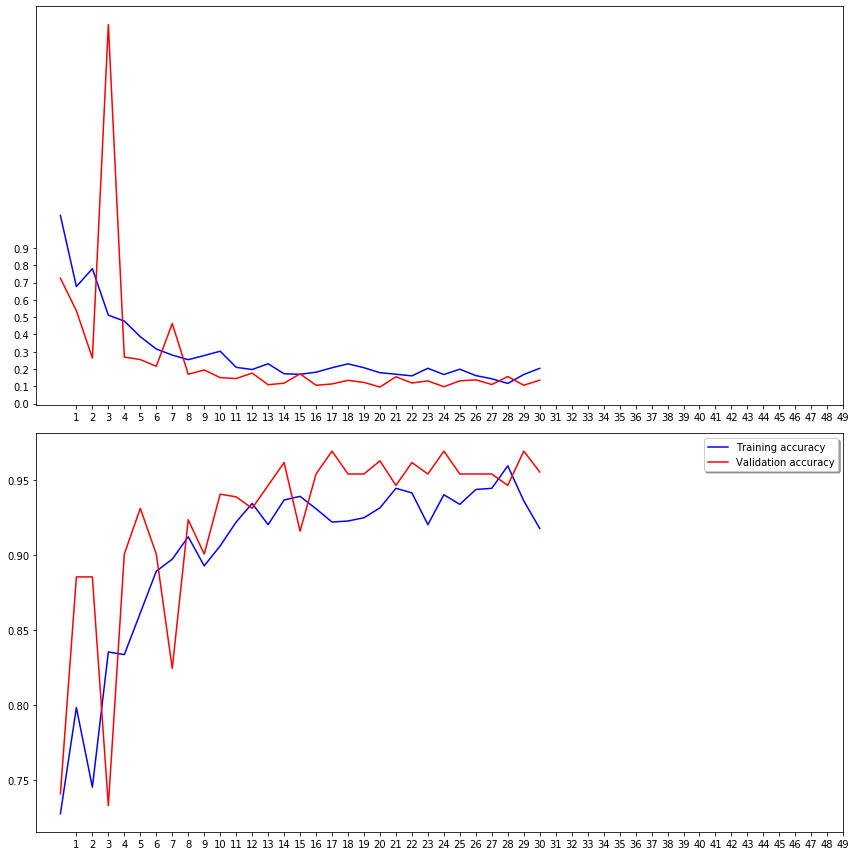

In [42]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))
ax1.plot(history.history['loss'], color='b', label="Training loss")
ax1.plot(history.history['val_loss'], color='r', label="validation loss")
ax1.set_xticks(np.arange(1, epochs, 1))
ax1.set_yticks(np.arange(0, 1, 0.1))

ax2.plot(history.history['acc'], color='b', label="Training accuracy")
ax2.plot(history.history['val_acc'], color='r',label="Validation accuracy")
ax2.set_xticks(np.arange(1, epochs, 1))

legend = plt.legend(loc='best', shadow=True)
plt.tight_layout()
plt.show()

In [43]:
!pip install opencv-python

KeyboardInterrupt: ignored

Predictions on single image

In [46]:
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import load_model
 
# load and prepare the image
def load_image(filename):

	# load the image
	img = load_img(filename, target_size=(IMAGE_HEIGHT, IMAGE_WIDTH)) 
	# convert to array

	img = img_to_array(img)
	# reshape into a single sample with 3 channels
	img = img.reshape(1,IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)
	# center pixel data
	
	return img
 
# load an image and predict the class
def run_example():
	# load the image
	img = load_image('../content/drive/My Drive/FYP/mixedData/1.12.jpg')
	# load model
	#model.load_weights('fireIntensityDetectionModel.h5')
	# predict the class
	result = model.predict_classes(img)[0]
  #img = load_img("../content/drive/My Drive/FYP/fire/"+filename, target_size=IMAGE_SIZE)
	#plt.subplot(6, 3, index+1)
	
	print(result)
 
 
# entry point, run the example
run_example()

1


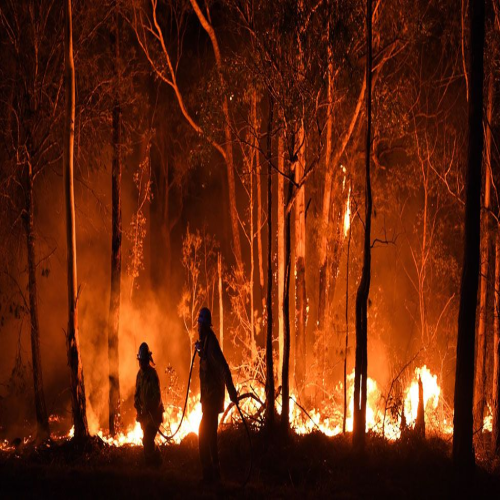

[0.9972863  0.00271373]


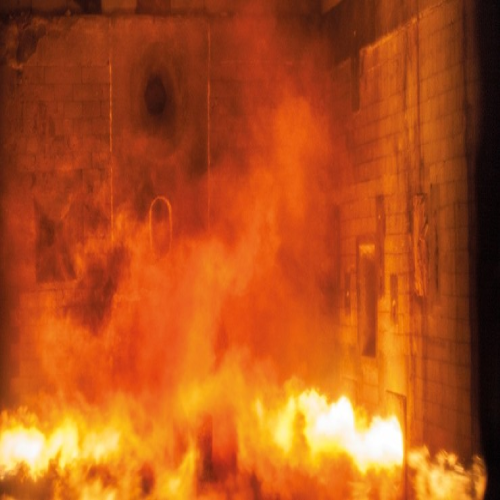

[0.15441744 0.8455825 ]


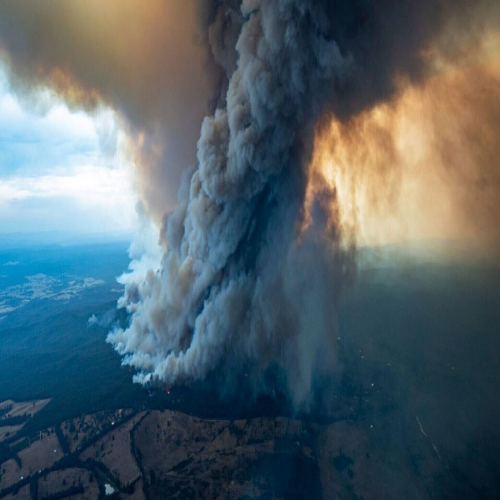

[0.9883869 0.011613 ]


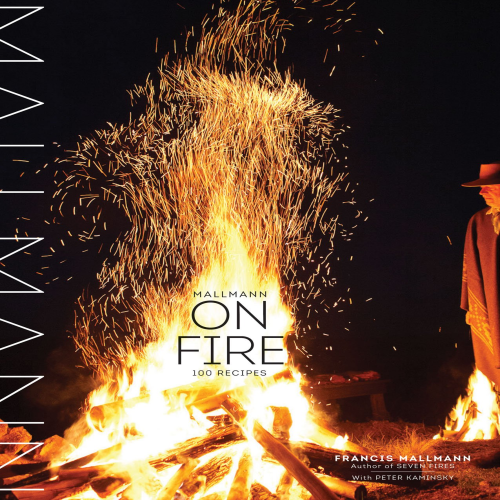

[9.9946886e-01 5.3118530e-04]


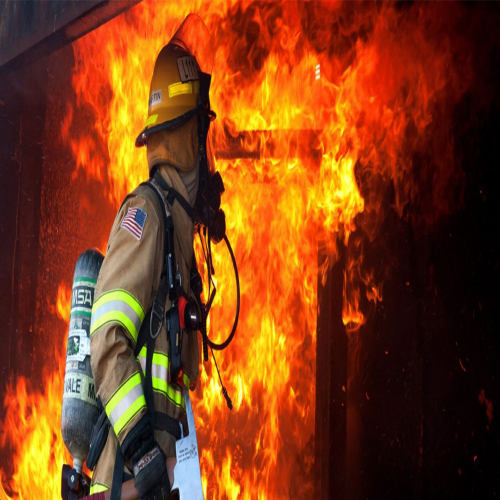

[9.9997795e-01 2.2035796e-05]


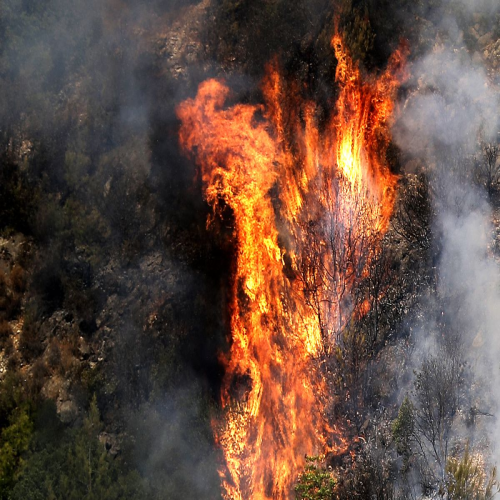

[9.999912e-01 8.805575e-06]


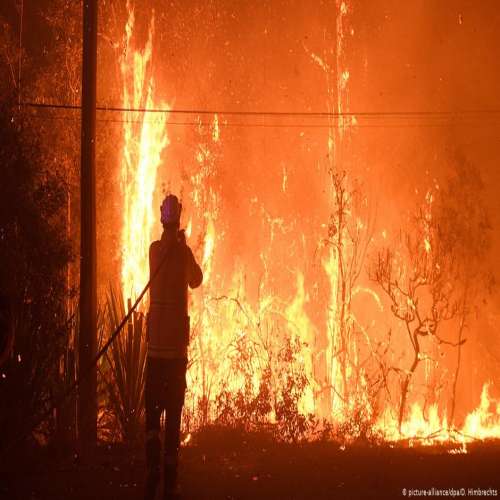

[0.95985734 0.04014268]


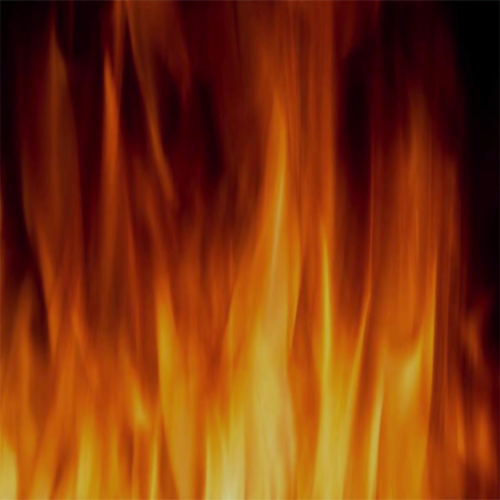

[0.9750972  0.02490279]


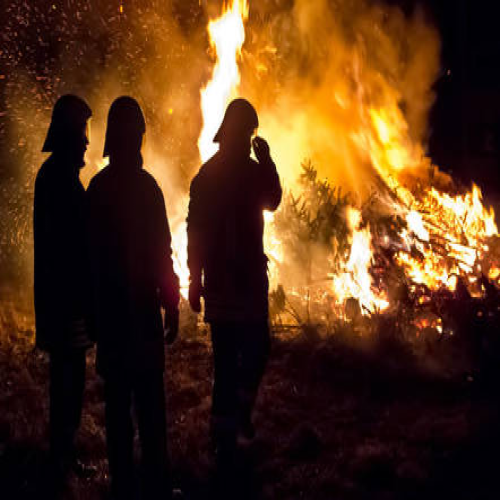

[9.993869e-01 6.130996e-04]


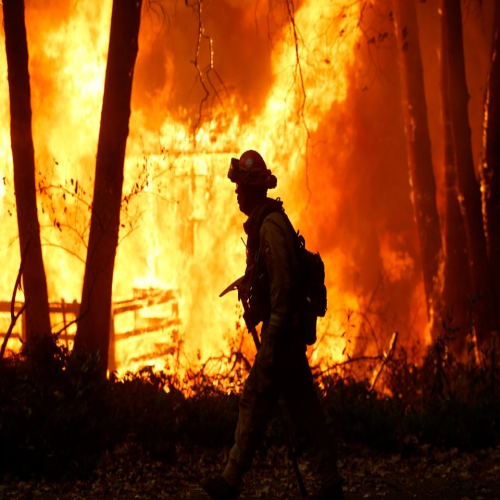

[9.9940979e-01 5.9022196e-04]


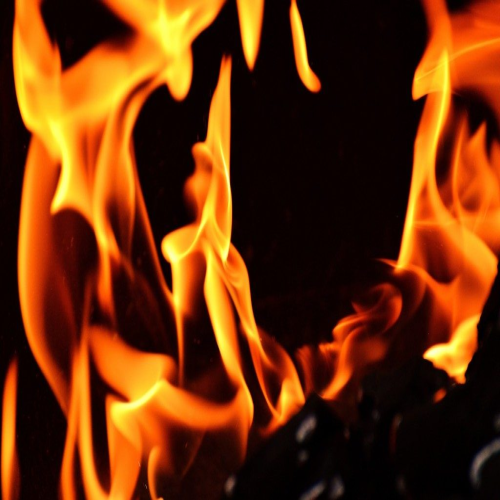

[0.95541364 0.0445864 ]


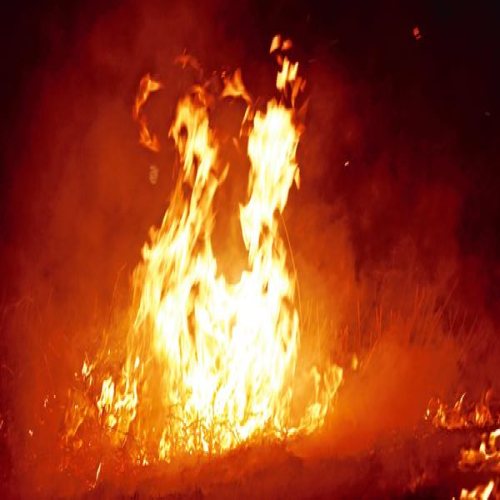

[0.9360724  0.06392765]


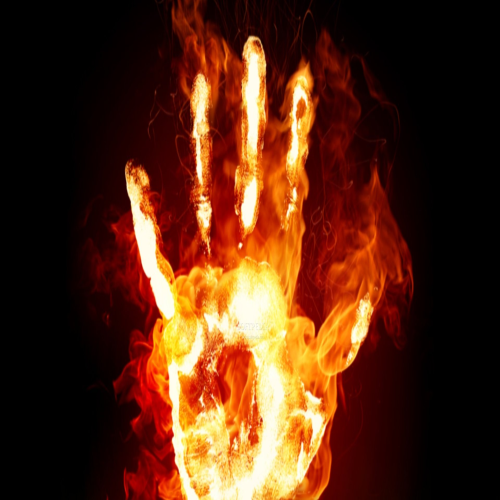

[0.2863974 0.7136026]


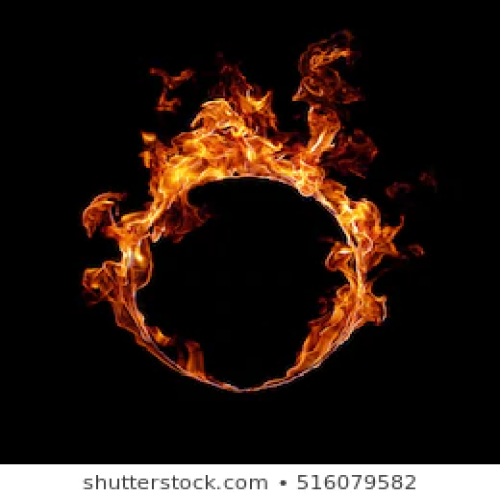

[0.9955915  0.00440854]


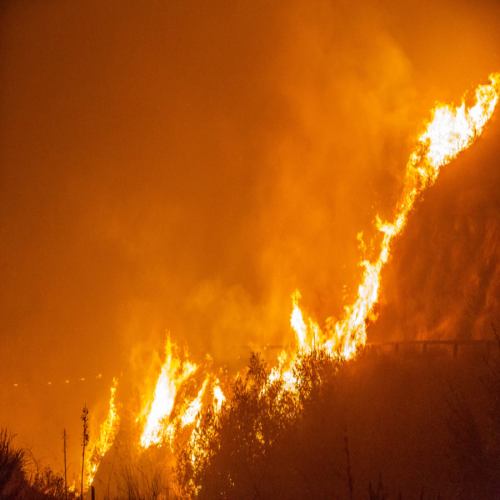

[9.9952841e-01 4.7163543e-04]


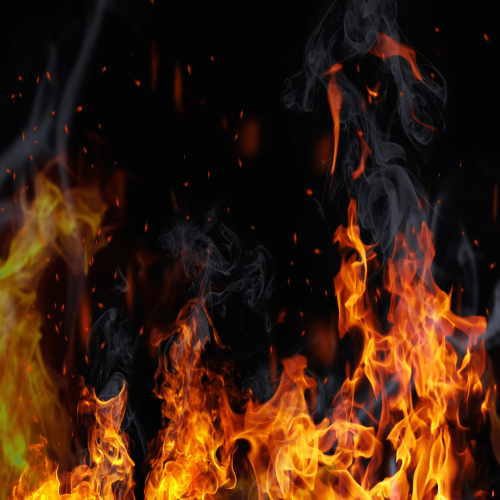

[9.9962652e-01 3.7347435e-04]


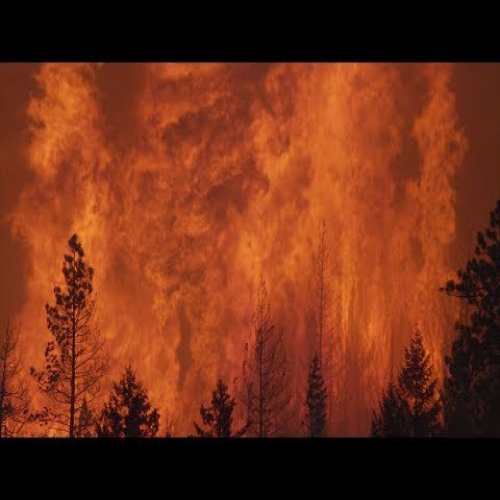

[9.9996102e-01 3.9033344e-05]


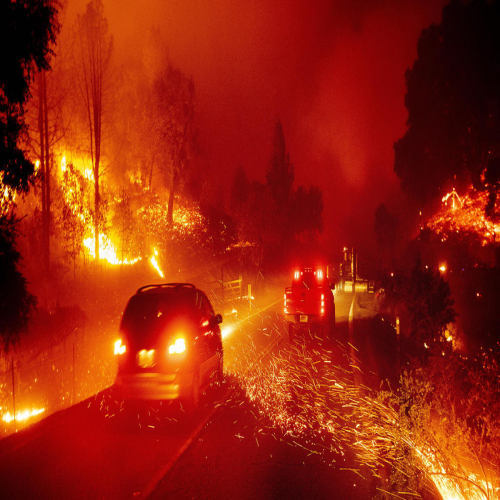

[0.00374075 0.99625933]


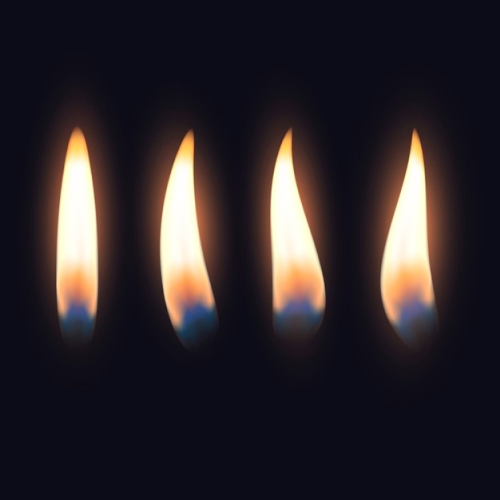

[0.05767517 0.9423249 ]


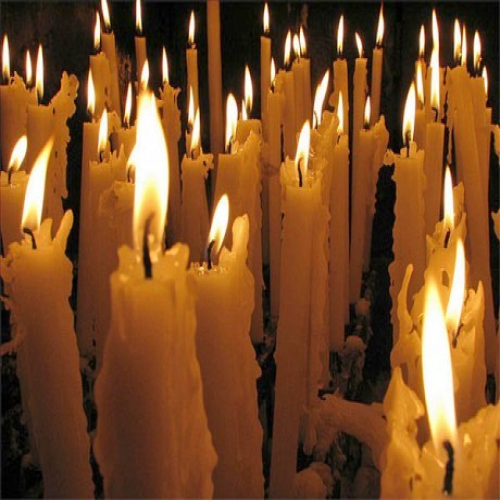

[0.16177024 0.8382298 ]


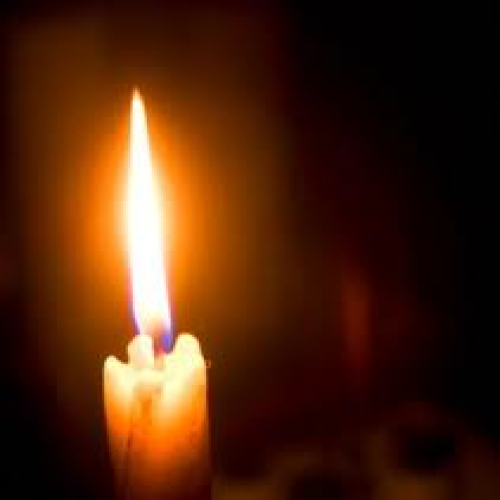

[2.0709449e-04 9.9979287e-01]


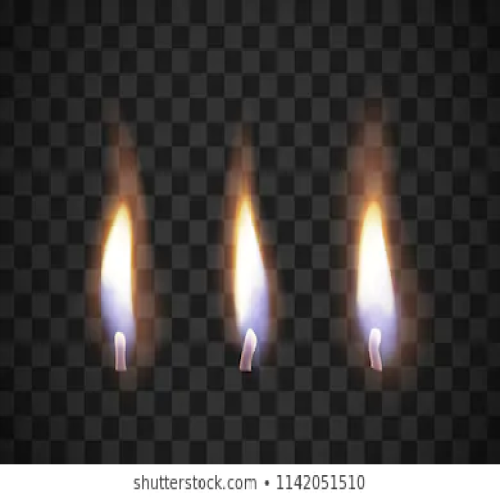

[0.9547816  0.04521846]


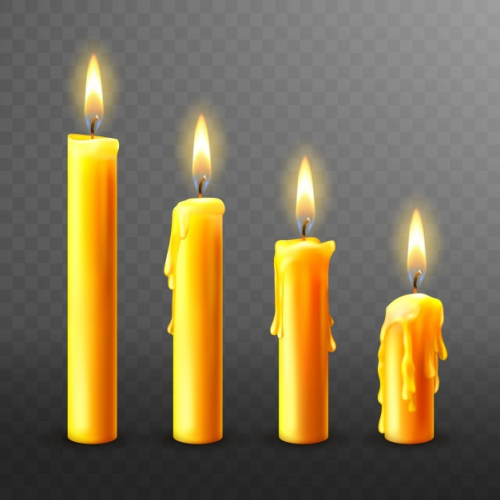

[0.00114696 0.9988531 ]


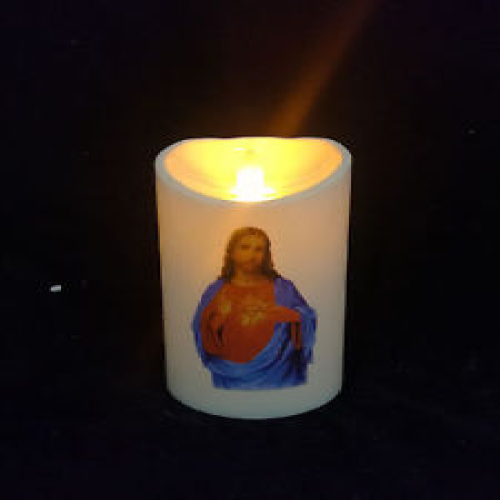

[0.03785113 0.96214885]


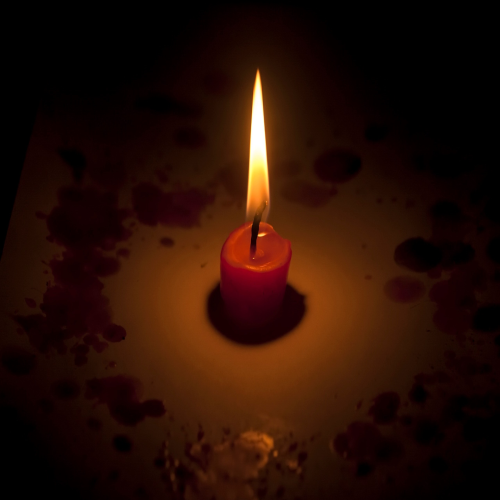

[0.09737895 0.90262103]


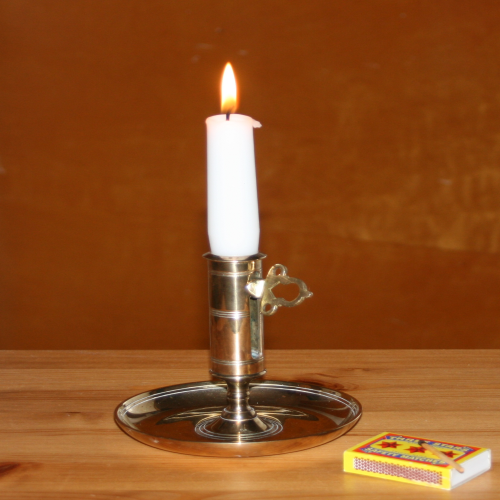

[0.00285525 0.99714476]


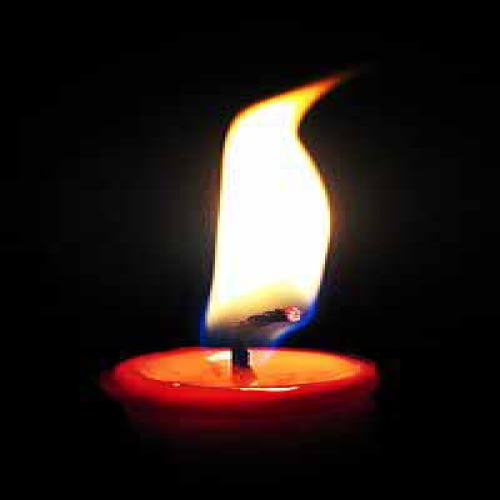

[2.3200086e-05 9.9997675e-01]


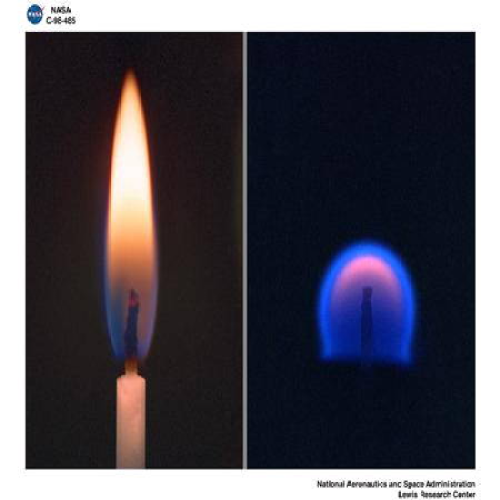

[0.04114882 0.95885116]


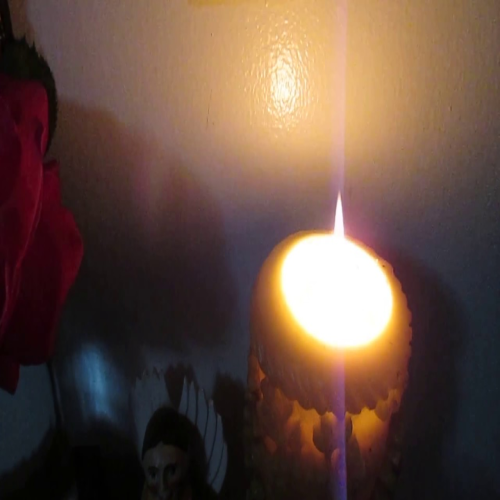

[0.15756844 0.84243155]


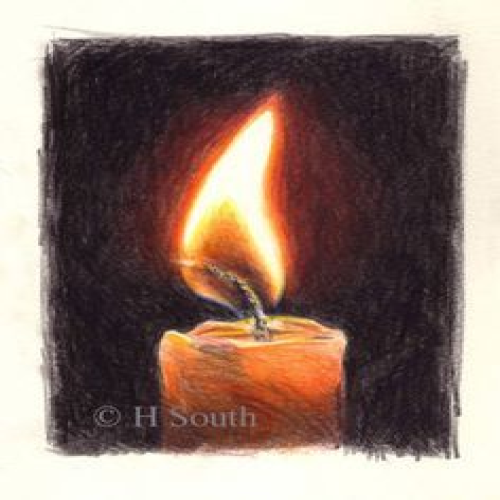

[0.0027137 0.9972863]


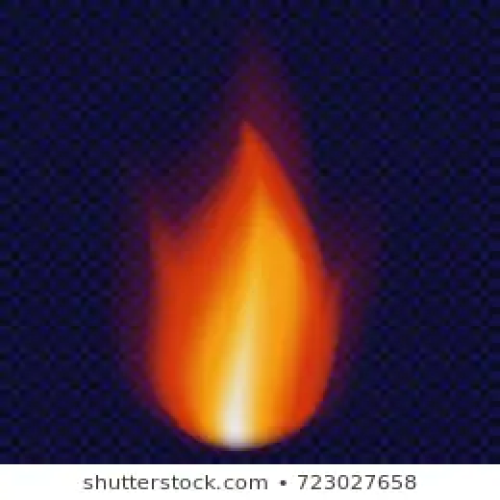

[0.00222889 0.99777114]


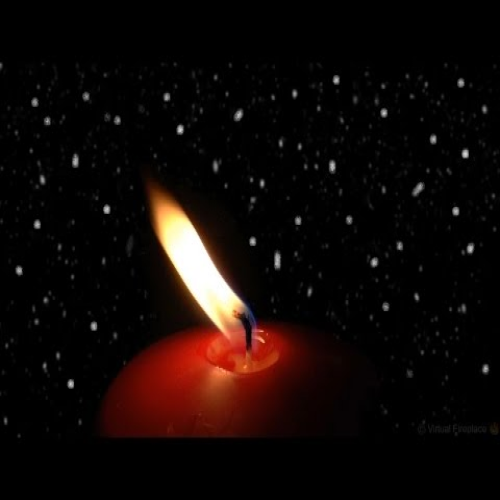

[0.00865869 0.9913413 ]


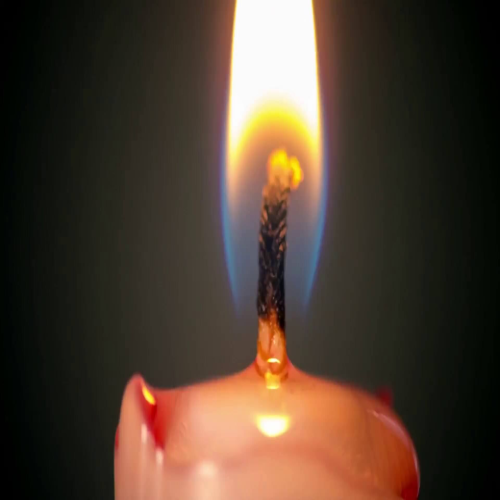

[0.46980998 0.53019   ]


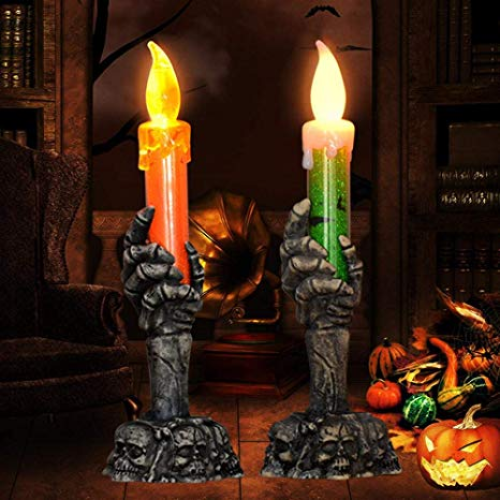

[5.960083e-10 1.000000e+00]


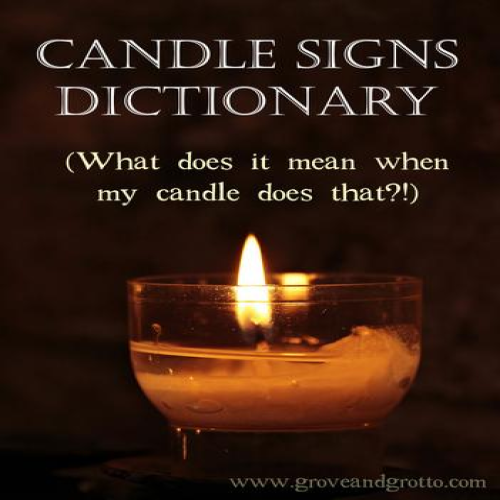

[0.33618218 0.6638178 ]


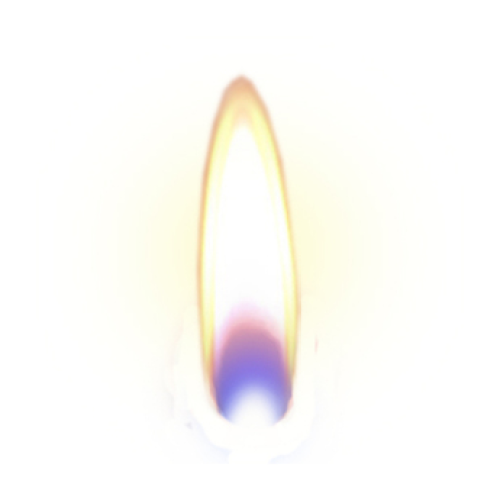

[0.02591618 0.9740838 ]


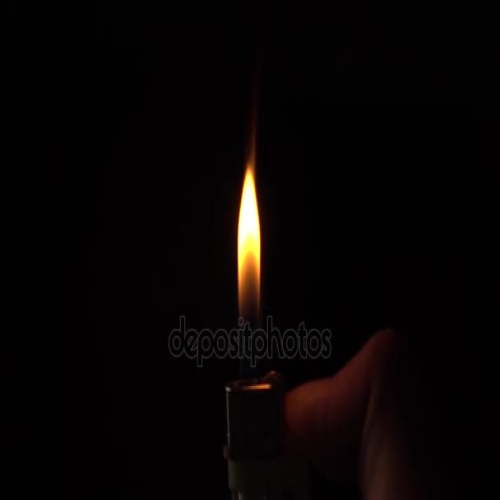

[0.01617165 0.9838284 ]


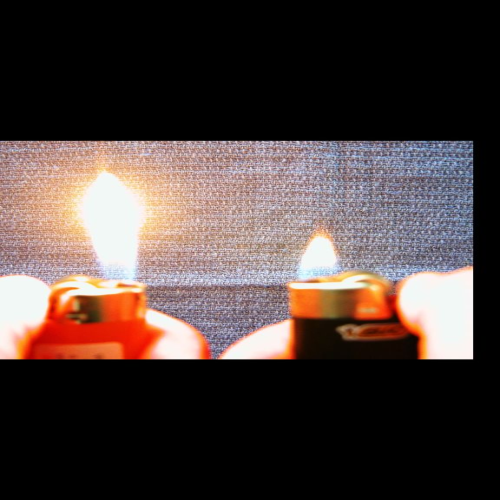

[0.00480915 0.99519086]


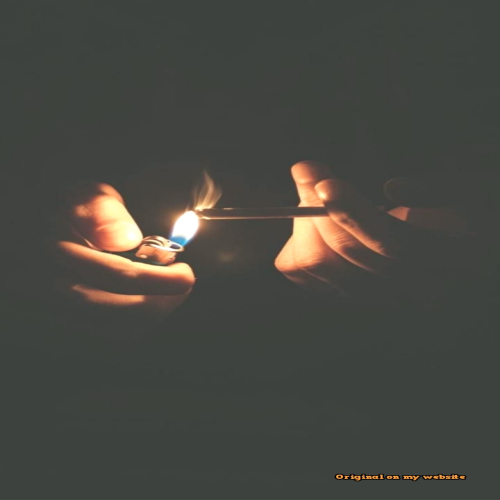

[1.6106891e-05 9.9998391e-01]


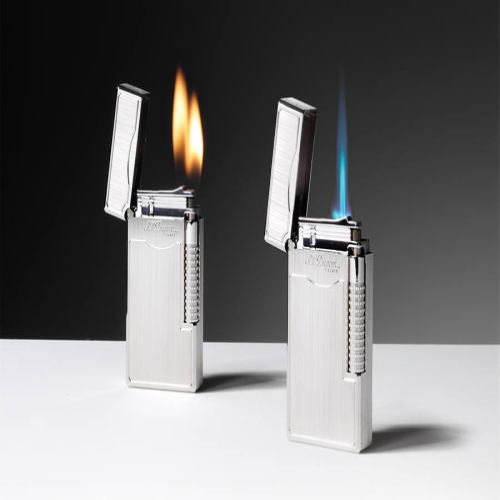

[3.5696686e-04 9.9964297e-01]


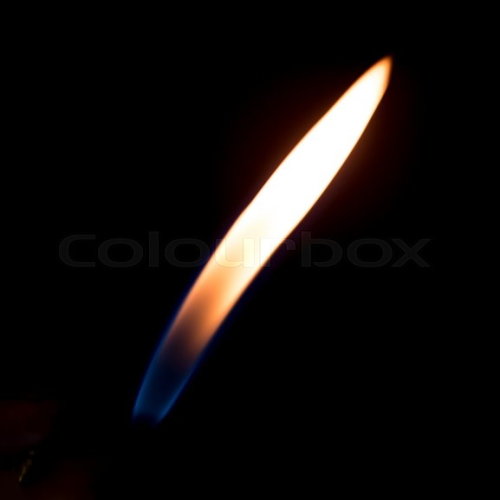

[3.0625591e-04 9.9969375e-01]


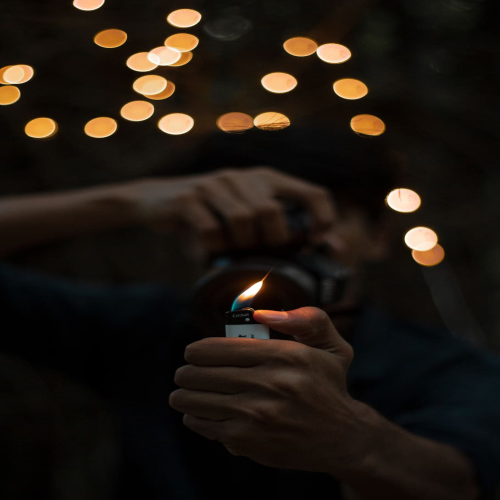

[8.8807102e-04 9.9911195e-01]


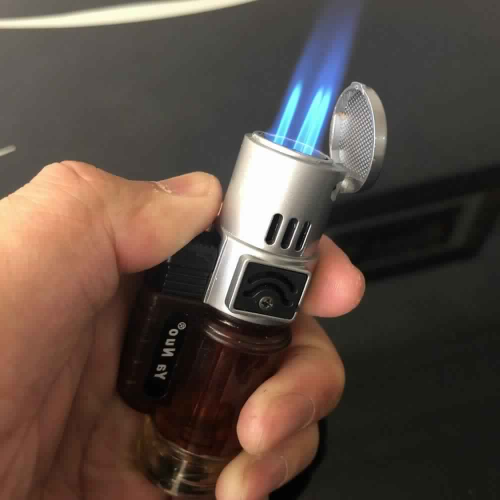

[2.7291030e-06 9.9999726e-01]


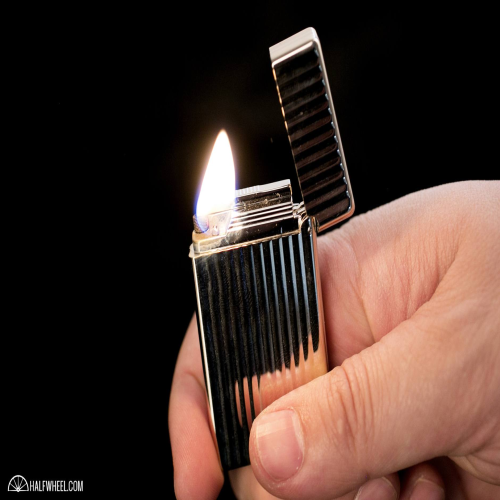

[1.1141506e-04 9.9988854e-01]


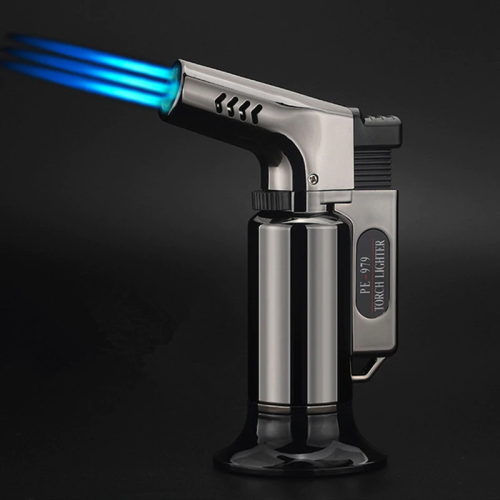

[0.02435137 0.9756486 ]


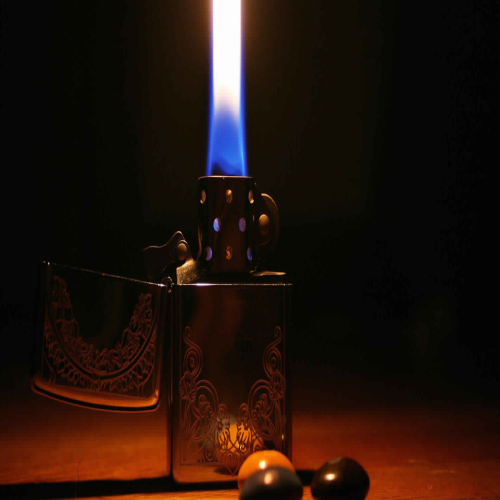

[7.381345e-04 9.992619e-01]


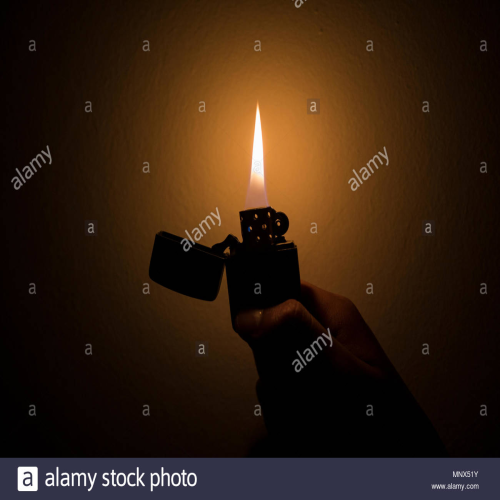

Found 53 validated image filenames.
[9.9999416e-01 5.8041110e-06]


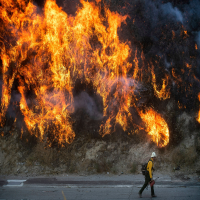

[0.9599157  0.04008436]


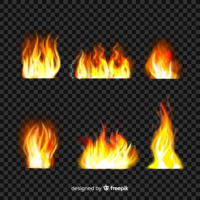

[0.9927174  0.00728262]


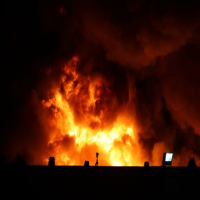

[9.9999976e-01 2.6633677e-07]


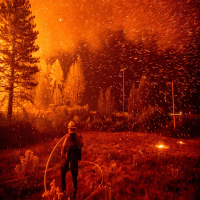

[0.4094643 0.5905357]


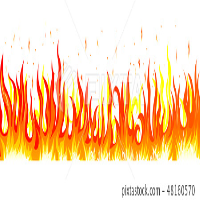

[0.9965569  0.00344317]


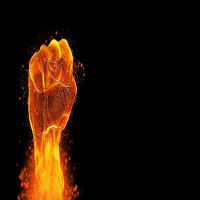

[9.9998474e-01 1.5295796e-05]


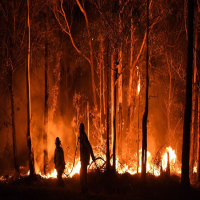

[0.9972863  0.00271373]


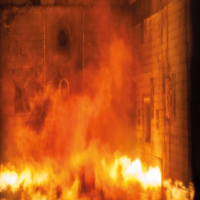

[0.15441744 0.8455825 ]


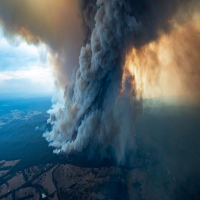

[0.9883869 0.011613 ]


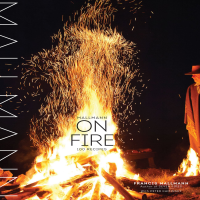

[9.9946886e-01 5.3118530e-04]


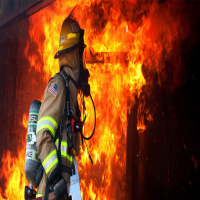

[9.9997795e-01 2.2035796e-05]


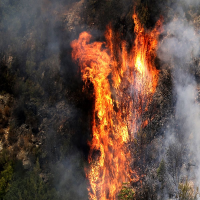

[9.999912e-01 8.805575e-06]


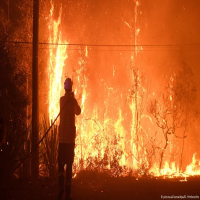

[0.95985734 0.04014268]


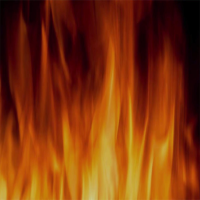

[0.9750972  0.02490279]


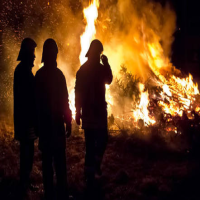

[9.993869e-01 6.130996e-04]


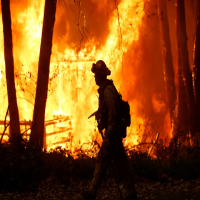

[9.9940979e-01 5.9022196e-04]


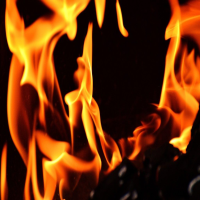

[0.95541364 0.0445864 ]


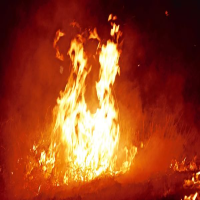

[0.9360724  0.06392765]


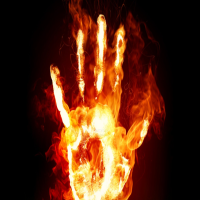

[0.2863974 0.7136026]


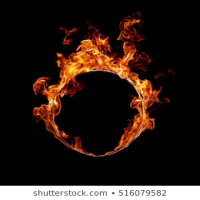

[0.9955915  0.00440854]


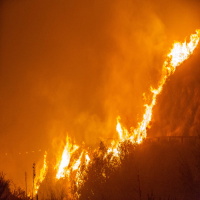

[9.9952841e-01 4.7163543e-04]


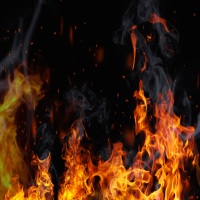

[9.9962652e-01 3.7347435e-04]


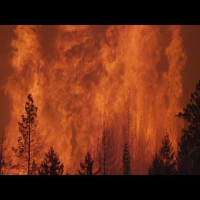

[9.9996102e-01 3.9033344e-05]


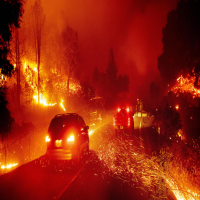

[0.00374075 0.99625933]


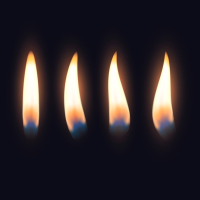

[0.05767517 0.9423249 ]


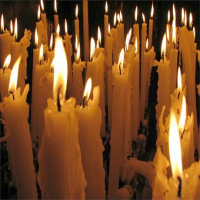

[0.16177024 0.8382298 ]


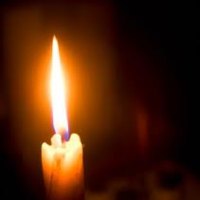

[2.0709449e-04 9.9979287e-01]


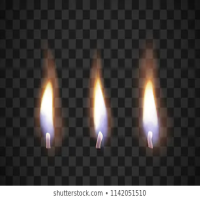

[0.9547816  0.04521846]


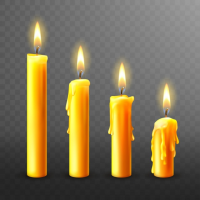

[0.00114696 0.9988531 ]


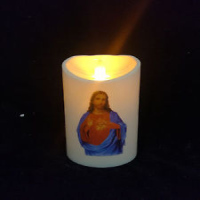

[0.03785113 0.96214885]


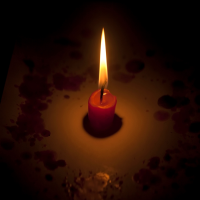

[0.09737895 0.90262103]


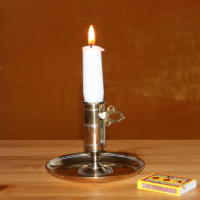

[0.00285525 0.99714476]


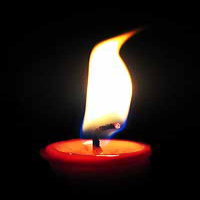

[2.3200086e-05 9.9997675e-01]


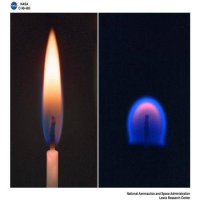

[0.04114882 0.95885116]


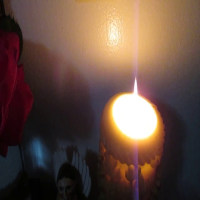

[0.15756844 0.84243155]


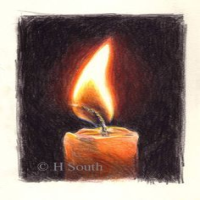

[0.0027137 0.9972863]


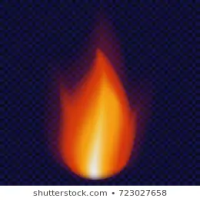

[0.00222889 0.99777114]


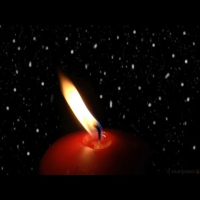

[0.00865869 0.9913413 ]


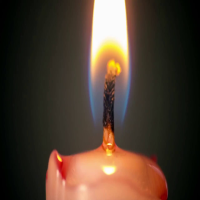

[0.46980998 0.53019   ]


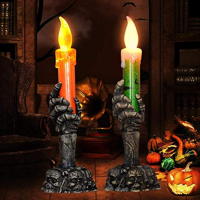

[5.960083e-10 1.000000e+00]


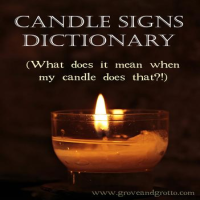

[0.33618218 0.6638178 ]


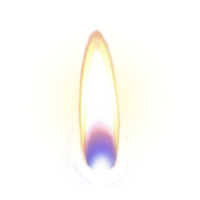

[0.02591618 0.9740838 ]


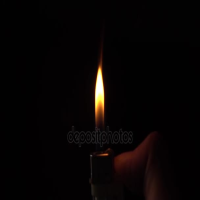

[0.01617165 0.9838284 ]


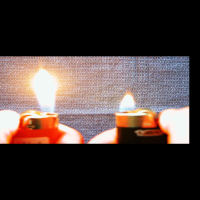

[0.00480915 0.99519086]


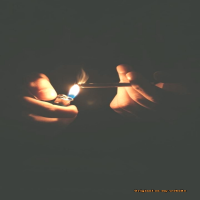

[1.6106891e-05 9.9998391e-01]


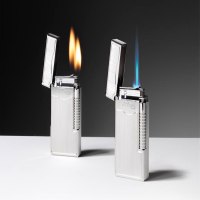

[3.5696686e-04 9.9964297e-01]


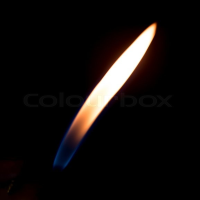

[3.0625591e-04 9.9969375e-01]


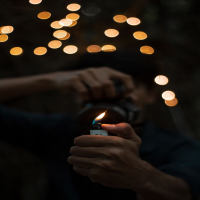

[8.8807102e-04 9.9911195e-01]


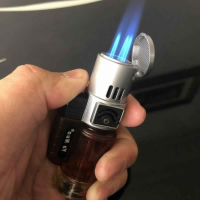

[2.7291030e-06 9.9999726e-01]


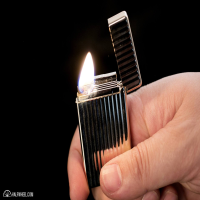

[1.1141506e-04 9.9988854e-01]


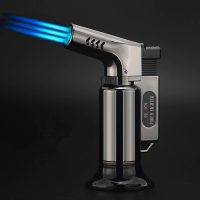

[0.02435137 0.9756486 ]


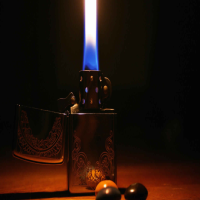

[7.381345e-04 9.992619e-01]


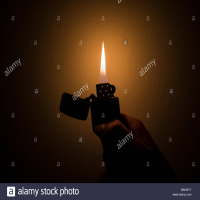

In [63]:
from google.colab.patches import cv2_imshow
test_filenames = os.listdir("../content/drive/My Drive/FYP/candle flame")
test_df = pd.DataFrame({
    'filename': test_filenames
})
nb_samples = test_df.shape[0]
test_gen = ImageDataGenerator(rescale=1./255)
test_generator = test_gen.flow_from_dataframe(
    test_df, 
    "../content/drive/My Drive/FYP/candle flame", 
    x_col='filename',
    y_col=None,
    class_mode=None,
    target_size=IMAGE_SIZE,
    batch_size=batch_size,
    shuffle=False
)
predict = model.predict_generator(test_generator, steps=np.ceil(nb_samples/batch_size))
test_df['category'] = np.argmax(predict, axis=-1)
i= 0
for t in test_filenames:
  print(predict[i])
  i+=1
  img = cv2.imread("../content/drive/My Drive/FYP/candle flame/" + t,cv2.IMREAD_UNCHANGED)
  dim = (200, 200)
# resize image
  img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
  #img = img_to_array(img)
  #img = img.reshape(1,IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)
  cv2_imshow(img)


In [0]:
label_map = dict((v,k) for k,v in train_generator.class_indices.items())
test_df['category'] = test_df['category'].replace(label_map)
test_df['category'] = test_df['category'].replace({ 'dog': 1, 'cat': 0 })
test_df['category'].value_counts().plot.bar()

In [0]:
sample_test = test_df.head(18)
sample_test.head()
plt.figure(figsize=(12, 24))
for index, row in sample_test.iterrows():
    filename = row['filename']
    category = row['category']
    img = load_img("../content/drive/My Drive/FYP/fire/"+filename, target_size=IMAGE_SIZE)
    plt.subplot(6, 3, index+1)
    plt.imshow(img)
    plt.xlabel(filename + '(' + "{}".format(category) + ')' )
plt.tight_layout()
plt.show()


In [0]:
test_filenames = os.listdir("../content/drive/My Drive/FYP/candle flame")
test_df = pd.DataFrame({
    'filename': test_filenames
})
nb_samples = test_df.shape[0]
test_gen = ImageDataGenerator(rescale=1./255)
test_generator = test_gen.flow_from_dataframe(
    test_df, 
    "../content/drive/My Drive/FYP/candle flame", 
    x_col='filename',
    y_col=None,
    class_mode=None,
    target_size=IMAGE_SIZE,
    batch_size=batch_size,
    shuffle=False
)
predict = model.predict_generator(test_generator, steps=np.ceil(nb_samples/batch_size))
test_df['category1'] = np.argmax(predict, axis=-1)
print(predict)

In [0]:
label_map = dict((v,k) for k,v in train_generator.class_indices.items())
test_df['category'] = test_df['category'].replace(label_map)
test_df['category'] = test_df['category'].replace({ 'dog': 1, 'cat': 0 })
test_df['category'].value_counts().plot.bar()

In [0]:
sample_test = test_df.head(18)
sample_test.head()
plt.figure(figsize=(12, 24))
for index, row in sample_test.iterrows():
    filename = row['filename']
    category = row['category']
    img = load_img("../content/drive/My Drive/FYP/candle flame/"+filename, target_size=IMAGE_SIZE)
    plt.subplot(6, 3, index+1)
    plt.imshow(img)
    plt.xlabel(filename + '(' + "{}".format(category) + ')' )
plt.tight_layout()
plt.show()